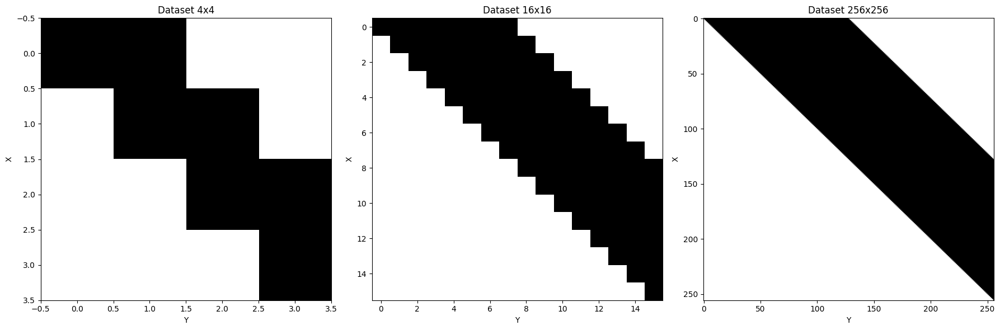

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Функция для генерации датасета
def generate_dataset(size, a):
    dataset = np.zeros((size, size))
    for x in range(size):
        y = x
        end = min(size, y + a // 2)
        dataset[x, y:end] = 1
    return dataset

sizes = [4, 16, 256]

datasets = [generate_dataset(size, size) for size in sizes]

# Визуализация датасетов
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
titles = ["Dataset 4x4", "Dataset 16x16", "Dataset 256x256"]

for ax, dataset, title in zip(axes, datasets, titles):
    ax.imshow(dataset, cmap='Greys', aspect='auto')
    ax.set_title(title)
    ax.set_xlabel("Y")
    ax.set_ylabel("X")

plt.tight_layout()
plt.show()


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.25.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


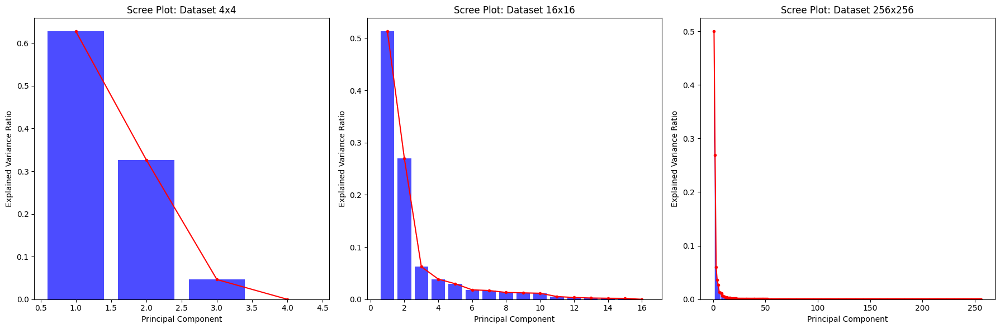

In [3]:
from sklearn.decomposition import PCA

# Функция для построения Scree plot
def plot_scree(data, ax, title):
    pca = PCA()
    pca.fit(data)
    explained_variance = pca.explained_variance_ratio_
    ax.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, color='b')
    ax.plot(range(1, len(explained_variance) + 1), explained_variance, 'r.-')
    ax.set_title(title)
    ax.set_xlabel('Principal Component')
    ax.set_ylabel('Explained Variance Ratio')

# Создание Scree plots для всех датасетов
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
titles = ["Scree Plot: Dataset 4x4", "Scree Plot: Dataset 16x16", "Scree Plot: Dataset 256x256"]

for ax, dataset, title in zip(axes, datasets, titles):
    plot_scree(dataset, ax, title)

plt.tight_layout()
plt.show()


Dataset of 4x4...


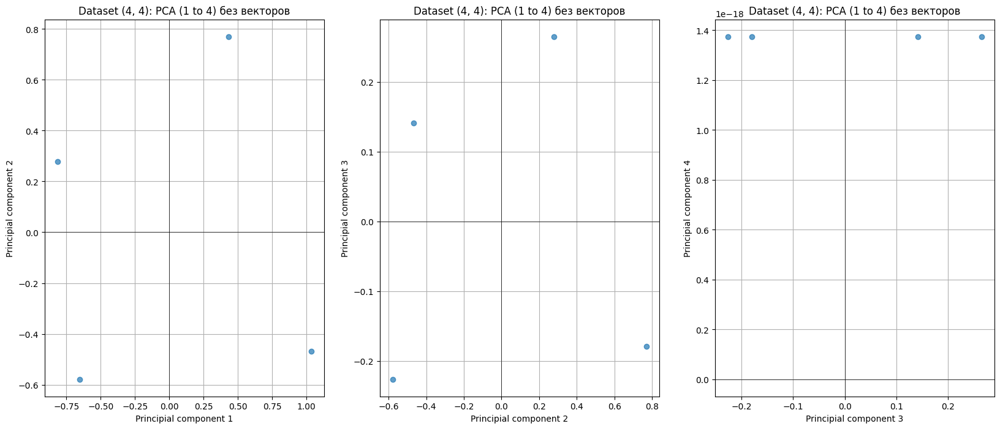

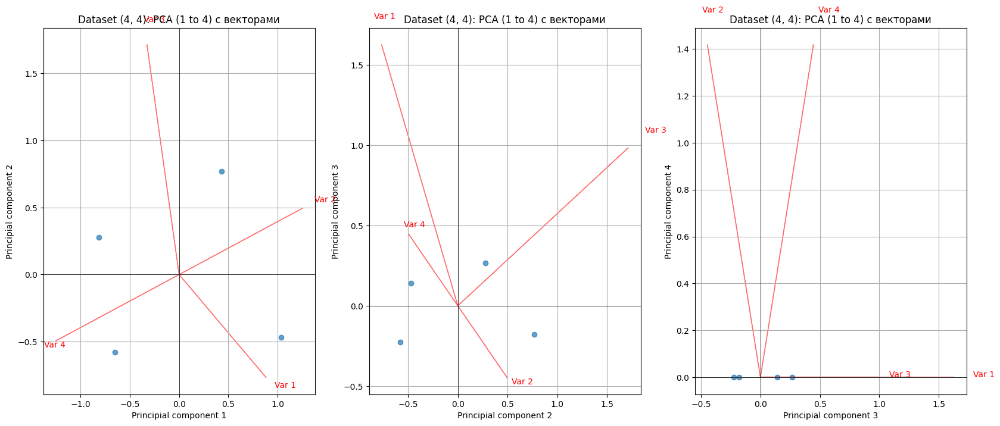

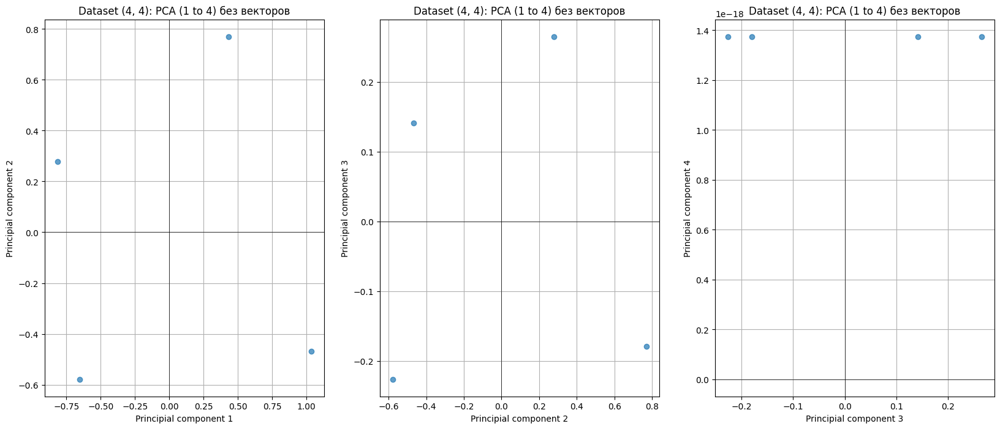

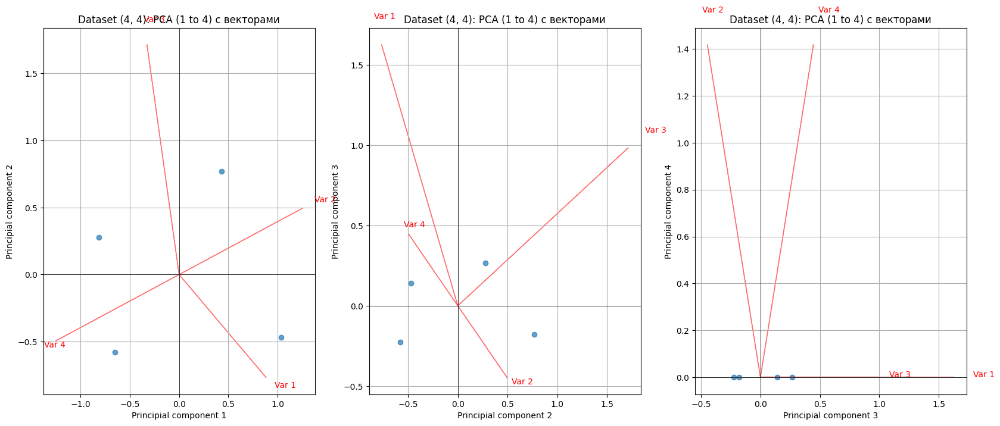

Dataset of 16x16...


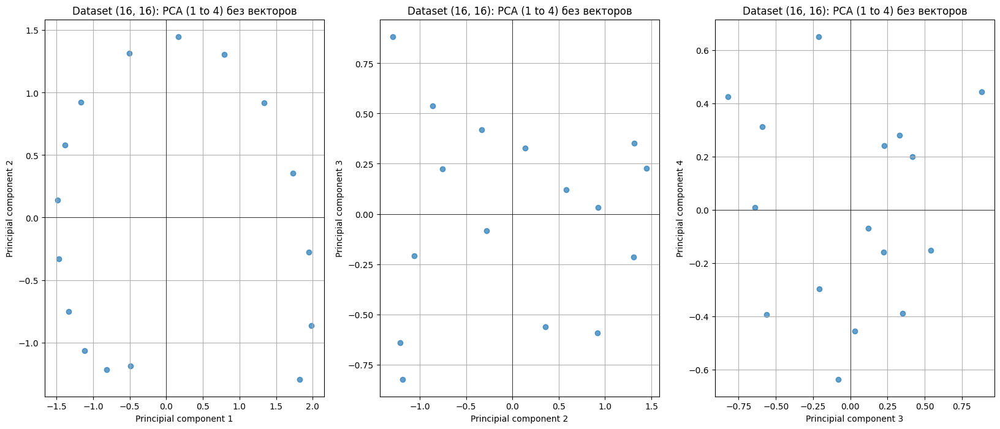

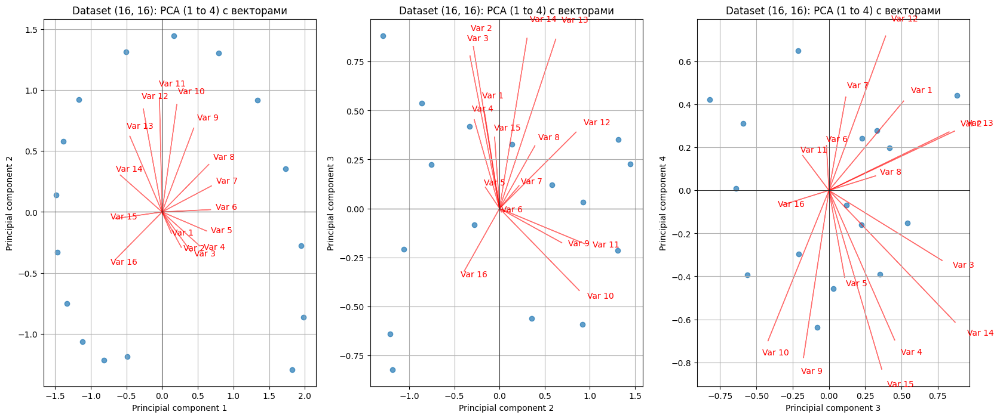

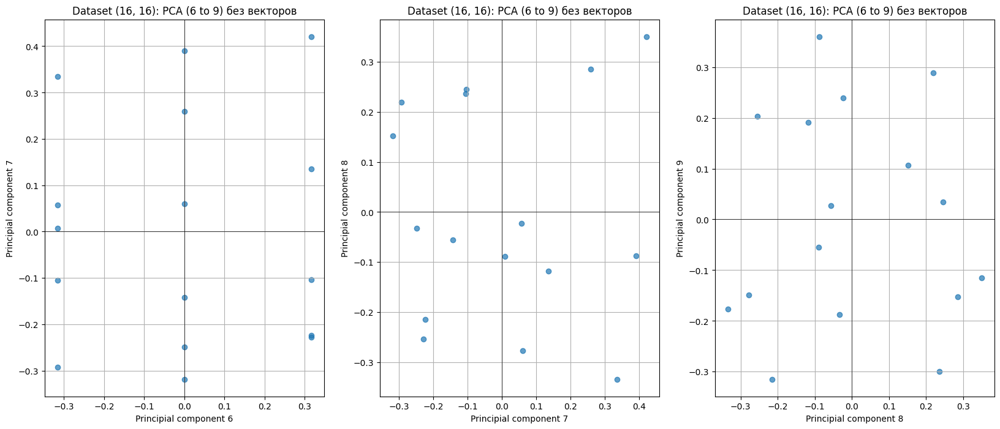

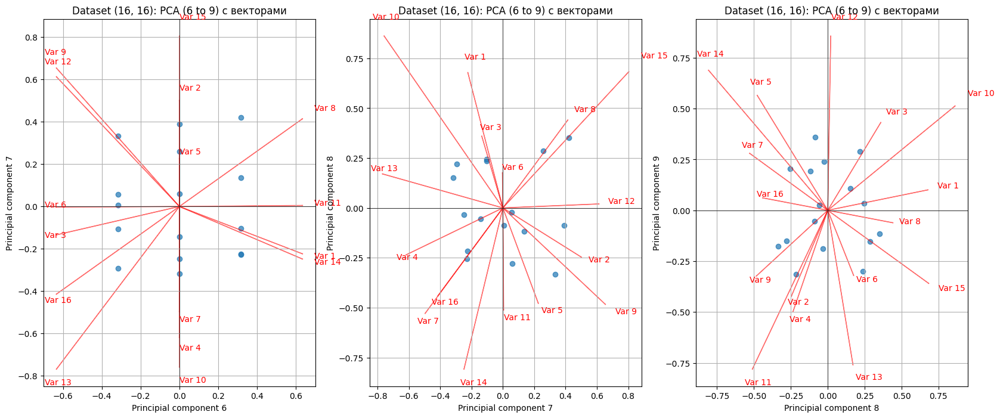

Dataset of 256x256...


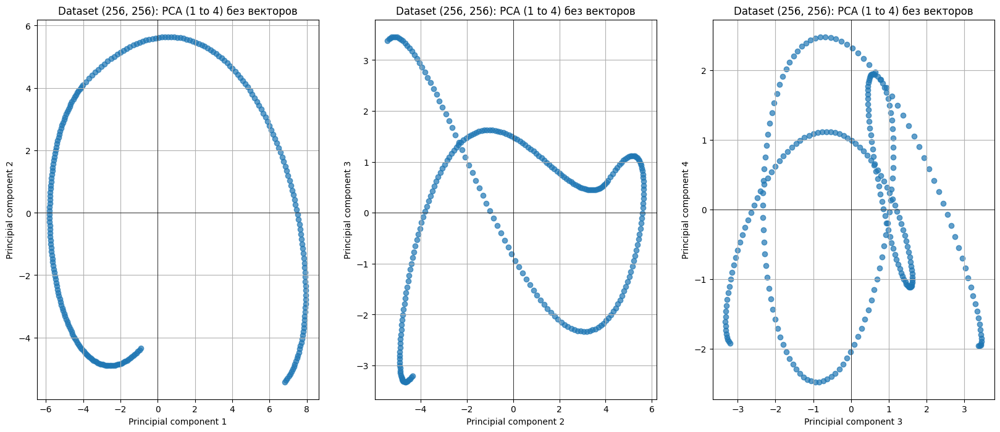

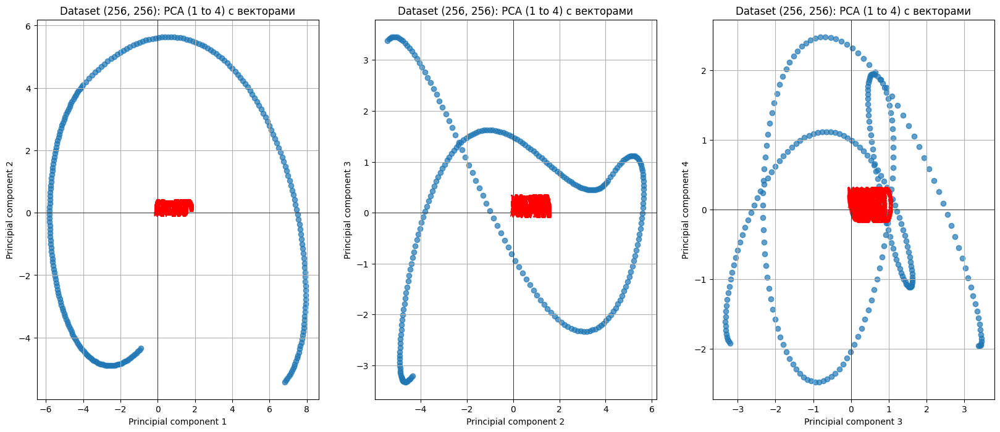

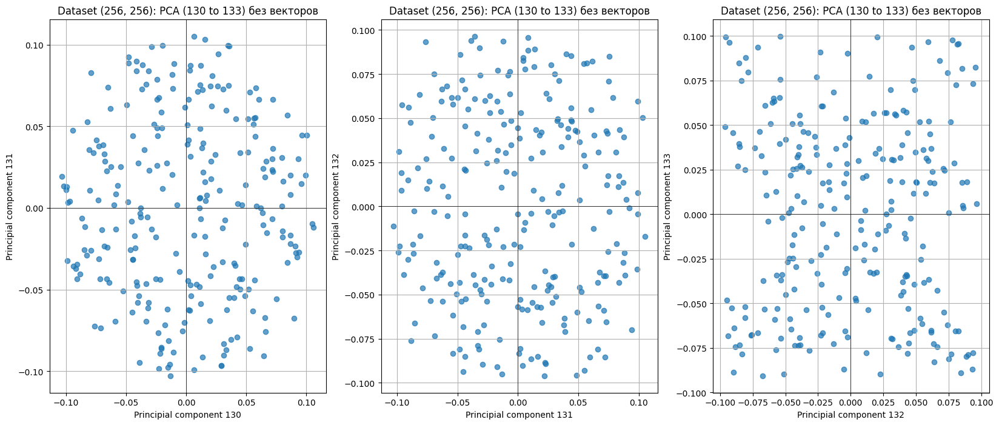

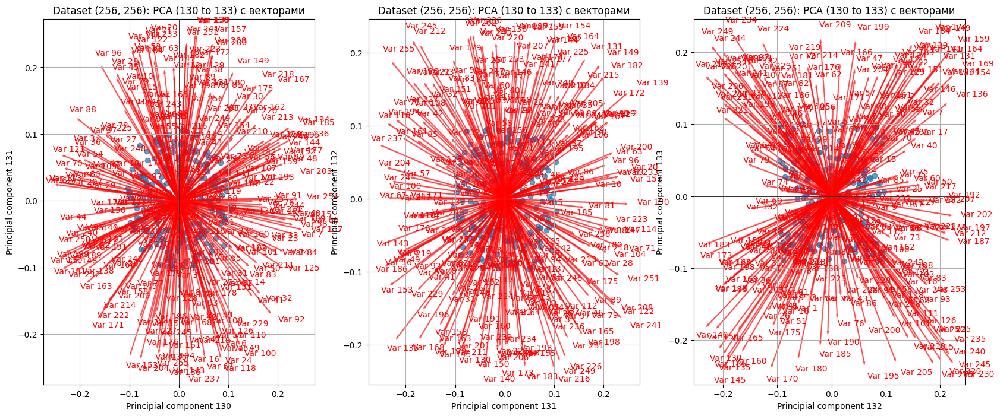

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def visualize_pca(data, a, title, c=0, show_vectors=False):
    pca = PCA(n_components=(a+c))
    transformed_data = pca.fit_transform(data)
    
    fig, axs = plt.subplots(1, a-1, figsize=(20, 8))
    for ax, cs in zip(axs, range(c, c+a-1)):
        ax.scatter(transformed_data[:, cs], transformed_data[:, cs + 1], alpha=0.7)

        if show_vectors:
            for i, vector in enumerate(pca.components_.T):
                ax.arrow(0, 0, vector[cs] * 2, vector[cs + 1] * 2, color='r', alpha=0.5)
                ax.text(vector[cs] * 2.2, vector[cs + 1] * 2.2, f'Var {i+1}', color='r', fontsize=10)
        
        ax.set_title(title)
        ax.set_xlabel(f'Principial component {cs+1}')
        ax.set_ylabel(f'Principial component {cs+2}')
        ax.axhline(0, color='black', linewidth=0.5)
        ax.axvline(0, color='black', linewidth=0.5)
        ax.grid()
    plt.show()

a = 4

adjusted_a_values = [min(a, size) for size in sizes]
adjusted_c_values = [0, 5, 129]

for i, dataset in enumerate(datasets):
    size = dataset.shape
    adjusted_a = adjusted_a_values[i]
    adjusted_c = adjusted_c_values[i]
    print(f'Dataset of {size[0]}x{size[0]}...')


    # Визуализация (1 до a)
    visualize_pca(dataset, a=adjusted_a, title=f'Dataset {size}: PCA (1 to {adjusted_a}) без векторов', show_vectors=False)
    visualize_pca(dataset, a=adjusted_a, title=f'Dataset {size}: PCA (1 to {adjusted_a}) с векторами', show_vectors=True)

    # Визуализация (c до c + a)
    visualize_pca(dataset, a=adjusted_a, title=f'Dataset {size}: PCA ({adjusted_c+1} to {adjusted_c+adjusted_a}) без векторов', c=adjusted_c, show_vectors=False)
    visualize_pca(dataset, a=adjusted_a, title=f'Dataset {size}: PCA ({adjusted_c+1} to {adjusted_c+adjusted_a}) с векторами', c=adjusted_c, show_vectors=True)


Running UMAP with dataset of shape (4, 4)...


/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to 

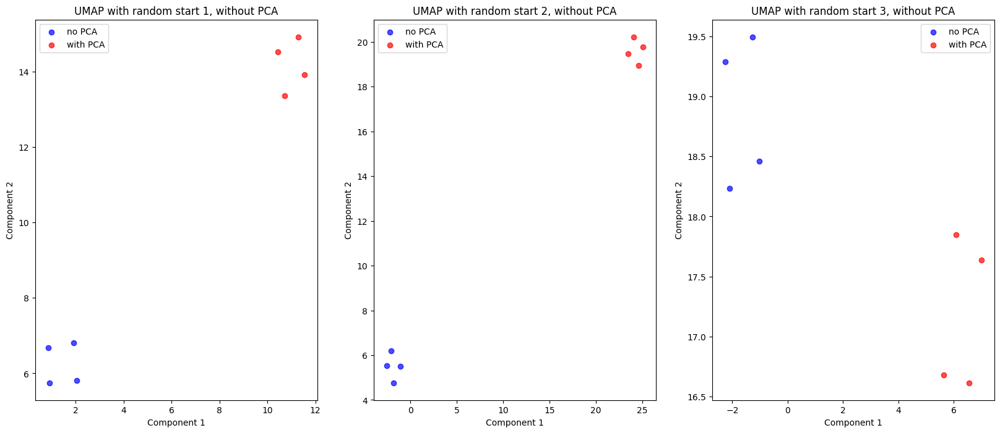

Running UMAP with dataset of shape (16, 16)...


/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by set

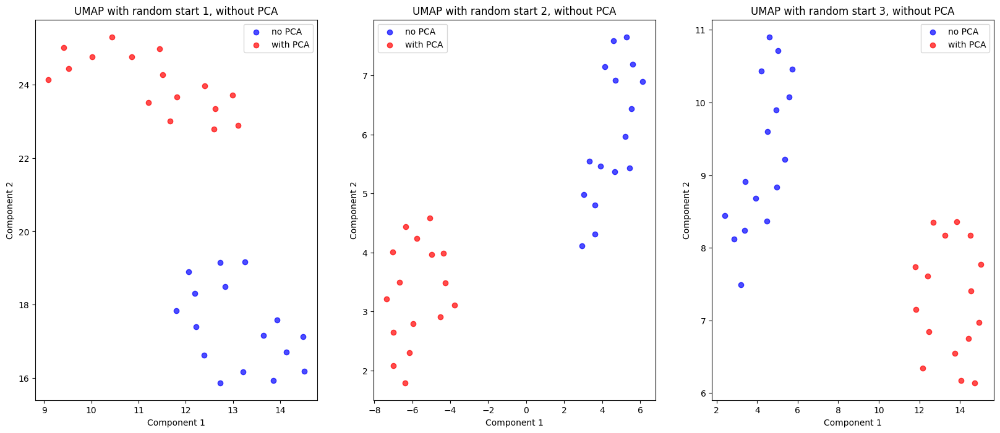

Running UMAP with dataset of shape (256, 256)...


/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by set

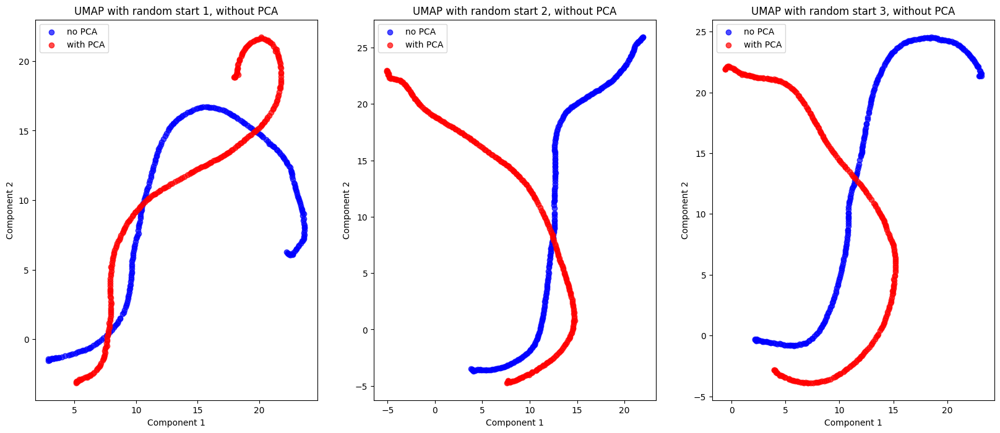

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

import umap.umap_ as umap


# Функция для визуализации проекций
def visualize_projections(transformed_data, title, ax, c='blue'):
    ax.scatter(transformed_data[:, 0], transformed_data[:, 1], alpha=0.7, c=c, label='with PCA' if c!='blue' else "no PCA")
    ax.set_title(title)
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.legend()
    ax.grid()

# Функция для выполнения UMAP с несколькими случайными стартами
def run_umap_with_random_starts(data, n_starts=5):
    fig, axs = plt.subplots(1, n_starts, figsize=(20, 8))
    for i in range(n_starts):
        umap_model = umap.UMAP(n_components=2, random_state=i)
        umap_result = umap_model.fit_transform(data)

        visualize_projections(umap_result, f"UMAP with random start {i+1}, without PCA", axs[i])

        pca = PCA()
        transformed_data = pca.fit_transform(data)

        umap_model = umap.UMAP(n_components=2, random_state=i)
        umap_result = umap_model.fit_transform(transformed_data)
        visualize_projections(umap_result, f"UMAP with random start {i+1}, without PCA", axs[i], c='red')
    plt.show()

from sklearn.manifold import TSNE

for dataset in datasets:
    print(f"Running UMAP with dataset of shape {dataset.shape}...")
    run_umap_with_random_starts(dataset, n_starts=3)

Running with dataset of shape (4, 4)...
Running with dataset of shape (16, 16)...
Running with dataset of shape (256, 256)...


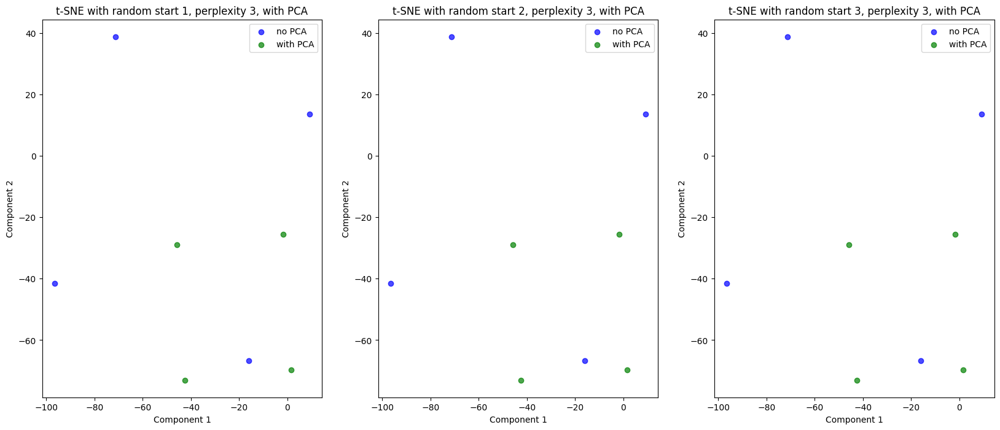

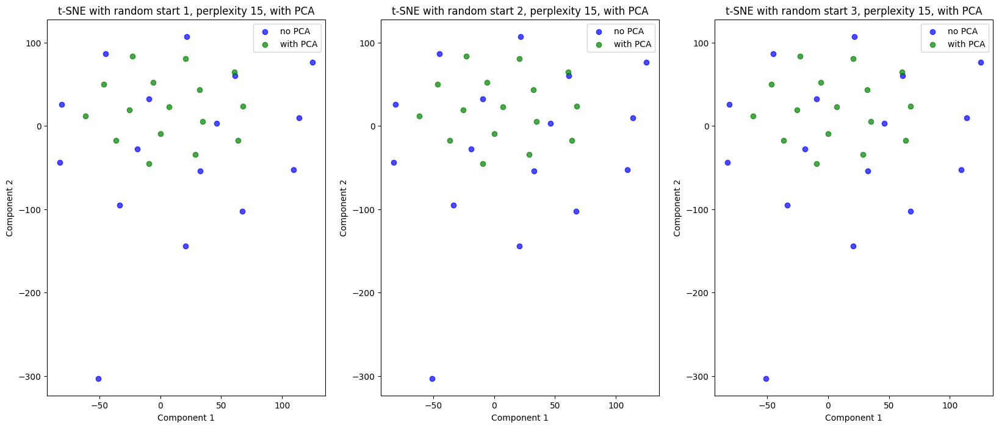

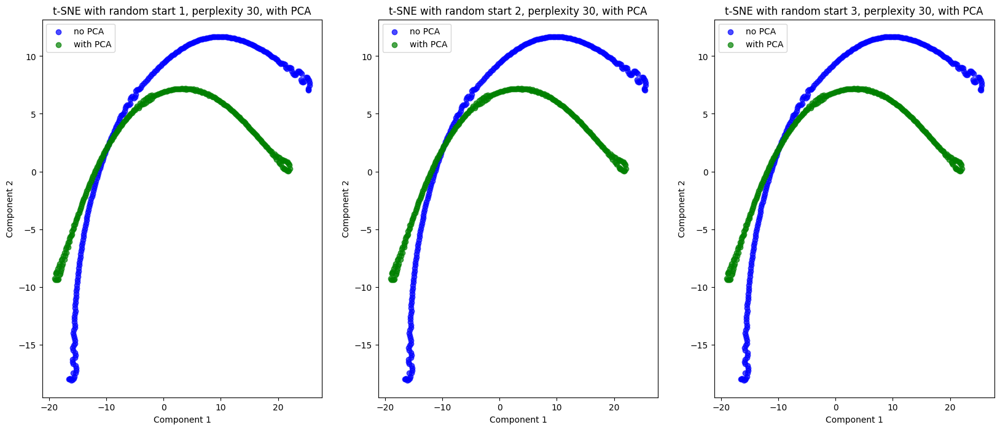

In [22]:
def run_tsne_with_random_starts(data, n_starts=5):
    n_samples = data.shape[0]
    
    perplexity_value = min(30, n_samples - 1)
    fig, axs = plt.subplots(1, n_starts, figsize=(20, 8))
    for i in range(n_starts):
        tsne_model = TSNE(n_components=2, random_state=i, perplexity=perplexity_value)
        tsne_result = tsne_model.fit_transform(data)
        visualize_projections(tsne_result, f"t-SNE with random start {i+1}, perplexity {perplexity_value}, without PCA", axs[i])
        pca = PCA(n_components=2)
        transformed_data = pca.fit_transform(data)
        tsne_model = TSNE(n_components=2, random_state=i, perplexity=perplexity_value)
        tsne_result = tsne_model.fit_transform(transformed_data)
        visualize_projections(tsne_result, f"t-SNE with random start {i+1}, perplexity {perplexity_value}, with PCA", axs[i], c='green')

# Пример работы с т-SNE, UMAP и PacMAP с корректировкой perplexity
for dataset in datasets:
    print(f"Running with dataset of shape {dataset.shape}...")
    # t-SNE
    run_tsne_with_random_starts(dataset, n_starts=3)




Running with dataset of shape (16, 16)...
X is normalized
PaCMAP(n_neighbors=10, n_MN=5, n_FP=5, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=40)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((160, 2), (80, 2), (80, 2))
Initial Loss: 77.08189392089844
Iteration:   10, Loss: 85.292282
Iteration:   20, Loss: 72.454033
Iteration:   30, Loss: 68.944901
Iteration:   40, Loss: 67.903580
Iteration:   50, Loss: 66.675377
Iteration:   60, Loss: 65.559341
Iteration:   70, Loss: 64.518280
Iteration:   80, Loss: 63.493183
Iteration:   90, Loss: 62.473045
Iteration:  100, Loss: 61.447556
Iteration:  110, Loss: 80.273926
Iteration:  120, Loss: 79.914948
Iteration:  130, Loss: 79.847824
Iteration:  140, Loss: 79.809799
Iteration:  150, Loss: 79.806732
Iteration:  160, Loss: 79.802032
Iteration:  170, Loss: 79.801025
Iteration:  180, Loss: 79.800644
Iteration:  190, 

X is normalized
PaCMAP(n_neighbors=10, n_MN=5, n_FP=5, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=42)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((160, 2), (80, 2), (80, 2))
Initial Loss: 77.08224487304688
Iteration:   10, Loss: 88.675339
Iteration:   20, Loss: 74.268707
Iteration:   30, Loss: 69.602112
Iteration:   40, Loss: 68.171036
Iteration:   50, Loss: 67.058334
Iteration:   60, Loss: 65.865715
Iteration:   70, Loss: 64.753319
Iteration:   80, Loss: 63.663086
Iteration:   90, Loss: 62.564980
Iteration:  100, Loss: 61.459480
Iteration:  110, Loss: 80.047615
Iteration:  120, Loss: 79.936813
Iteration:  130, Loss: 79.838432
Iteration:  140, Loss: 79.813873
Iteration:  150, Loss: 79.810150
Iteration:  160, Loss: 79.803612
Iteration:  170, Loss: 79.802498
Iteration:  180, Loss: 79.801819
Iteration:  190, Loss: 79.801666
Iteration:  200, Loss: 79.

Pairs sampled successfully.
((2560, 2), (1280, 2), (2560, 2))
Initial Loss: 1868.52001953125
Iteration:   10, Loss: 1460.270996
Iteration:   20, Loss: 1332.590820
Iteration:   30, Loss: 1267.302734
Iteration:   40, Loss: 1216.836914
Iteration:   50, Loss: 1166.551758
Iteration:   60, Loss: 1112.237793
Iteration:   70, Loss: 1050.497070
Iteration:   80, Loss: 976.385132
Iteration:   90, Loss: 879.471436
Iteration:  100, Loss: 725.453979
Iteration:  110, Loss: 943.334229
Iteration:  120, Loss: 938.546448
Iteration:  130, Loss: 934.816284
Iteration:  140, Loss: 933.303833
Iteration:  150, Loss: 932.892029
Iteration:  160, Loss: 932.520386
Iteration:  170, Loss: 932.477112
Iteration:  180, Loss: 932.416809
Iteration:  190, Loss: 932.297424
Iteration:  200, Loss: 932.141907
Iteration:  210, Loss: 389.651184
Iteration:  220, Loss: 379.135986
Iteration:  230, Loss: 376.729218
Iteration:  240, Loss: 376.405396
Iteration:  250, Loss: 376.270477
Iteration:  260, Loss: 376.092377
Iteration:  270,

Iteration:  420, Loss: 374.998962
Iteration:  430, Loss: 374.940613
Iteration:  440, Loss: 374.883179
Iteration:  450, Loss: 374.828461
Elapsed time: 0.06s
Applied PCA, the dimensionality becomes 100
PaCMAP(n_neighbors=10, n_MN=5, n_FP=10, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=41)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((2560, 2), (1280, 2), (2560, 2))
Initial Loss: 1868.5048828125


Iteration:   10, Loss: 1460.595215
Iteration:   20, Loss: 1327.994141
Iteration:   30, Loss: 1265.708862
Iteration:   40, Loss: 1213.576294
Iteration:   50, Loss: 1163.410767
Iteration:   60, Loss: 1109.184448
Iteration:   70, Loss: 1047.633545
Iteration:   80, Loss: 973.756470
Iteration:   90, Loss: 877.071411
Iteration:  100, Loss: 723.619141
Iteration:  110, Loss: 941.365356
Iteration:  120, Loss: 936.534973
Iteration:  130, Loss: 932.964478
Iteration:  140, Loss: 931.574097
Iteration:  150, Loss: 931.018066
Iteration:  160, Loss: 930.823120
Iteration:  170, Loss: 930.663635
Iteration:  180, Loss: 930.460938
Iteration:  190, Loss: 930.546143
Iteration:  200, Loss: 930.878540
Iteration:  210, Loss: 388.025146
Iteration:  220, Loss: 377.581543
Iteration:  230, Loss: 375.226929
Iteration:  240, Loss: 374.857605
Iteration:  250, Loss: 374.666443
Iteration:  260, Loss: 374.466248
Iteration:  270, Loss: 374.310364
Iteration:  280, Loss: 374.188843
Iteration:  290, Loss: 374.083435
Iterati

Iteration:  130, Loss: 933.357910
Iteration:  140, Loss: 931.879700
Iteration:  150, Loss: 931.045654
Iteration:  160, Loss: 931.147888
Iteration:  170, Loss: 930.696289
Iteration:  180, Loss: 930.411499
Iteration:  190, Loss: 930.606628
Iteration:  200, Loss: 930.608398
Iteration:  210, Loss: 389.262726
Iteration:  220, Loss: 378.804596
Iteration:  230, Loss: 375.848358
Iteration:  240, Loss: 375.152069
Iteration:  250, Loss: 374.895782
Iteration:  260, Loss: 374.701172
Iteration:  270, Loss: 374.535431
Iteration:  280, Loss: 374.399841
Iteration:  290, Loss: 374.281738
Iteration:  300, Loss: 374.173279
Iteration:  310, Loss: 374.072144
Iteration:  320, Loss: 373.977783
Iteration:  330, Loss: 373.888031
Iteration:  340, Loss: 373.803467
Iteration:  350, Loss: 373.722137
Iteration:  360, Loss: 373.644836
Iteration:  370, Loss: 373.570923
Iteration:  380, Loss: 373.499939
Iteration:  390, Loss: 373.431396
Iteration:  400, Loss: 373.365112
Iteration:  410, Loss: 373.301849
Iteration:  42

Iteration:  120, Loss: 935.988403
Iteration:  130, Loss: 932.037476
Iteration:  140, Loss: 930.710876
Iteration:  150, Loss: 930.131531
Iteration:  160, Loss: 929.839783
Iteration:  170, Loss: 929.680725
Iteration:  180, Loss: 929.673035
Iteration:  190, Loss: 929.676514
Iteration:  200, Loss: 929.732422
Iteration:  210, Loss: 387.138855
Iteration:  220, Loss: 376.691589
Iteration:  230, Loss: 374.376740
Iteration:  240, Loss: 373.979736
Iteration:  250, Loss: 373.791992
Iteration:  260, Loss: 373.595093
Iteration:  270, Loss: 373.442993
Iteration:  280, Loss: 373.329071
Iteration:  290, Loss: 373.230011
Iteration:  300, Loss: 373.138214
Iteration:  310, Loss: 373.051025
Iteration:  320, Loss: 372.968567
Iteration:  330, Loss: 372.889496
Iteration:  340, Loss: 372.813995
Iteration:  350, Loss: 372.741516
Iteration:  360, Loss: 372.672119
Iteration:  370, Loss: 372.604858
Iteration:  380, Loss: 372.540131
Iteration:  390, Loss: 372.477264
Iteration:  400, Loss: 372.416840
Iteration:  41

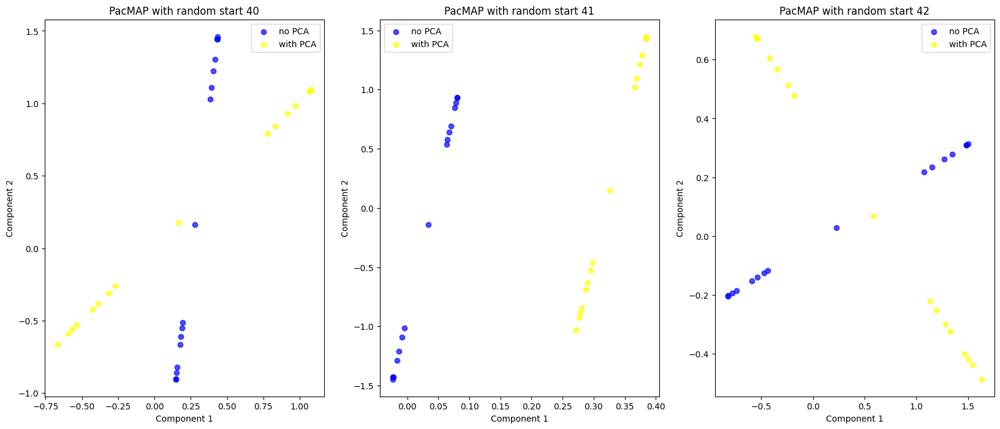

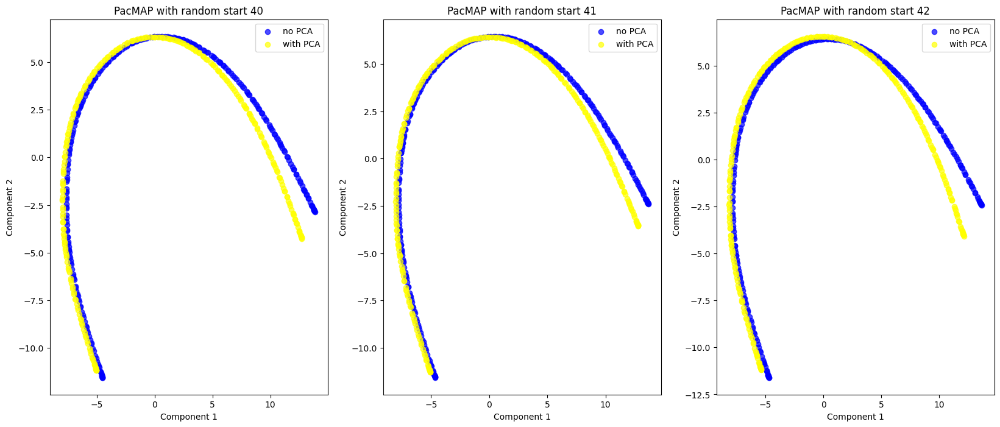

In [ ]:
import pacmap
def run_pacmap_with_random_starts(data, n_starts=5):
    fig, axs = plt.subplots(1, n_starts, figsize=(20, 8))
    for i in range(n_starts):
        pacmap_model = pacmap.PaCMAP(n_neighbors=None, random_state=i+40, FP_ratio=1.0, verbose=True)
        pacmap_result = pacmap_model.fit_transform(data, init='pca')
        visualize_projections(pacmap_result, f"PacMAP with random start {i+40}", axs[i])

        pca = PCA()
        transformed_data = pca.fit_transform(data)
        pacmap_model = pacmap.PaCMAP(n_components=2, n_neighbors=None, random_state=i+40, FP_ratio=1.0, verbose=True)
        pacmap_result = pacmap_model.fit_transform(transformed_data, init='pca')
        visualize_projections(pacmap_result, f"PacMAP with random start {i+40}", axs[i], c='yellow')
  
for dataset in datasets[1:]:
    print(f"Running with dataset of shape {dataset.shape}...")
    # PacMap
    run_pacmap_with_random_starts(dataset, n_starts=3)


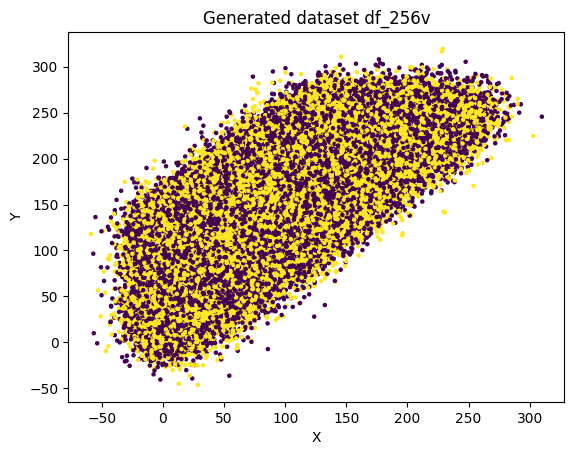

In [5]:
from sklearn.datasets import make_blobs

n_points_per_center = 10
d_range = (5, 20)
df_256 = datasets[2]

df_256v = []
df_size = 256

# Генерация точек

for x in range(df_size):
    for y in range(df_size):
        if df_256[x][y] == 1:
            d = np.random.uniform(d_range[0], d_range[1]) 
            class_label = np.random.choice([0, 1]) 
            X, _ = make_blobs(n_samples=n_points_per_center, centers=[(x, y)], cluster_std=d, n_features=2)

            labels = np.full((n_points_per_center, 1), class_label)

            df_256v.append(np.hstack((X, labels)))

df_256v = np.vstack(df_256v)

# Визуализация
plt.scatter(df_256v[:, 0], df_256v[:, 1], c=df_256v[:, 2], cmap='viridis', s=5)
plt.title('Generated dataset df_256v')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()


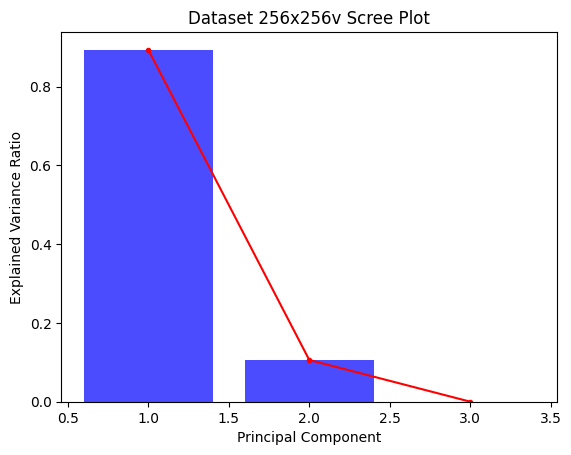

In [6]:
def plot_scree(data, title):
    pca = PCA()
    pca.fit(data)
    explained_variance = pca.explained_variance_ratio_
    plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, color='b')
    plt.plot(range(1, len(explained_variance) + 1), explained_variance, 'r.-')
    plt.title(title)
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.show()

plot_scree(df_256v, 'Dataset 256x256v Scree Plot')

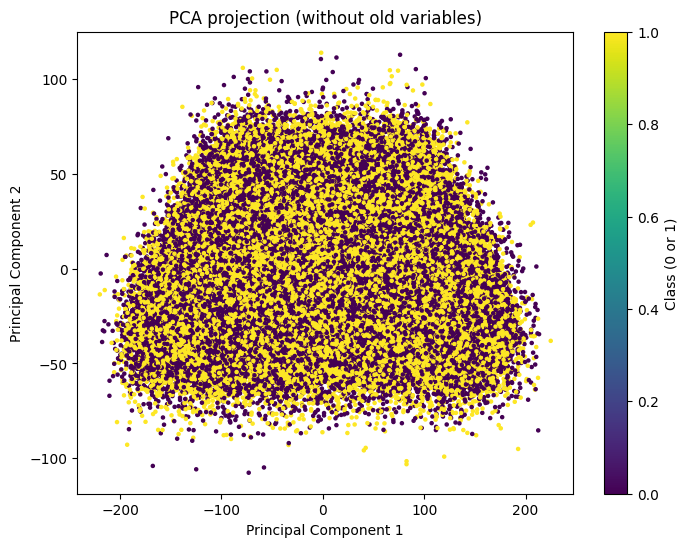

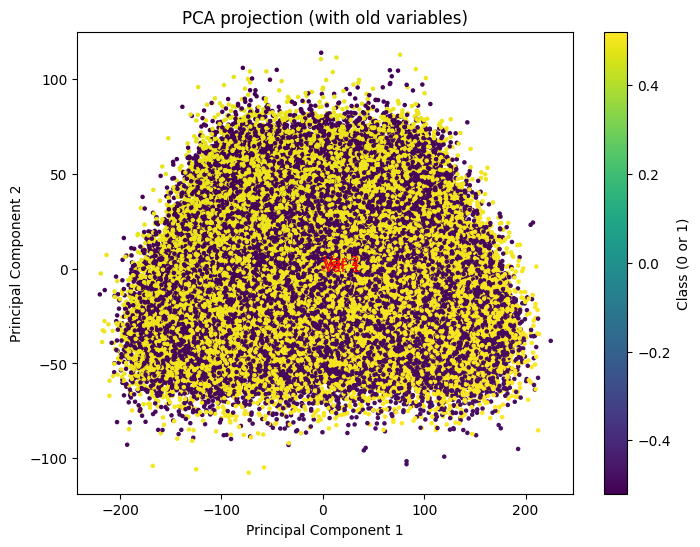

In [9]:
pca = PCA()
transformed_data = pca.fit_transform(df_256v)

plt.figure(figsize=(8, 6))
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=df_256v[:, 2], cmap='viridis', s=5)
plt.title("PCA projection (without old variables)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Class (0 or 1)")
plt.show()

plt.figure(figsize=(8, 6))
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=transformed_data[:, 2], cmap='viridis', s=5)
for i, vector in enumerate(pca.components_.T):
            plt.arrow(0, 0, vector[0] * 2, vector[1] * 2, color='r', alpha=0.5)
            plt.text(vector[0] * 2.2, vector[1] * 2.2, f'Var {i+1}', color='r', fontsize=10)
            
plt.title("PCA projection (with old variables)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Class (0 or 1)")
plt.show()


(12320, 3)


/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Plot with PCA


/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Plot with PCA


/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nerfman/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Plot with PCA


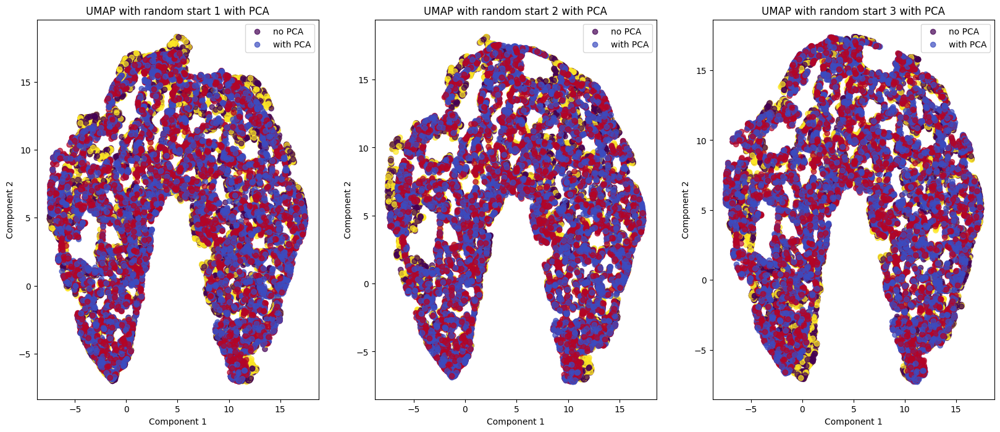

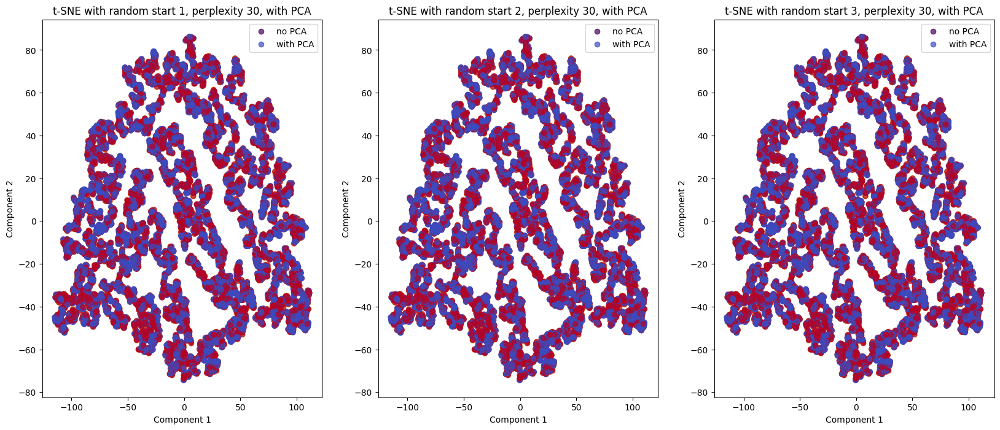

X is normalized
PaCMAP(n_neighbors=11, n_MN=6, n_FP=11, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=40)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((135520, 2), (73920, 2), (135520, 2))
Initial Loss: 99777.171875
Iteration:   10, Loss: 79450.812500
Iteration:   20, Loss: 72454.562500
Iteration:   30, Loss: 68781.234375
Iteration:   40, Loss: 65775.296875
Iteration:   50, Loss: 62867.664062
Iteration:   60, Loss: 59783.945312
Iteration:   70, Loss: 56266.347656
Iteration:   80, Loss: 51983.007812
Iteration:   90, Loss: 46211.476562
Iteration:  100, Loss: 36397.187500
Iteration:  110, Loss: 45321.703125
Iteration:  120, Loss: 44638.027344
Iteration:  130, Loss: 44428.011719
Iteration:  140, Loss: 44273.945312
Iteration:  150, Loss: 44179.179688
Iteration:  160, Loss: 44135.339844
Iteration:  170, Loss: 44109.273438
Iteration:  180, Loss: 44093.578125

Iteration:  420, Loss: 15814.111328
Iteration:  430, Loss: 15808.362305
Iteration:  440, Loss: 15803.173828
Iteration:  450, Loss: 15798.365234
Elapsed time: 1.50s
X is normalized
PaCMAP(n_neighbors=11, n_MN=6, n_FP=11, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=40)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((135520, 2), (73920, 2), (135520, 2))
Initial Loss: 99777.1796875
Iteration:   10, Loss: 79424.656250
Iteration:   20, Loss: 72439.648438
Iteration:   30, Loss: 68805.929688
Iteration:   40, Loss: 65828.953125
Iteration:   50, Loss: 62884.273438
Iteration:   60, Loss: 59794.445312
Iteration:   70, Loss: 56270.011719
Iteration:   80, Loss: 51987.593750
Iteration:   90, Loss: 46215.367188
Iteration:  100, Loss: 36400.273438
Iteration:  110, Loss: 45320.078125
Iteration:  120, Loss: 44641.984375
Iteration:  130, Loss: 44428.929688
Iteration:  14

Iteration:  440, Loss: 15803.099609
Iteration:  450, Loss: 15798.324219
Elapsed time: 1.49s
X is normalized
PaCMAP(n_neighbors=11, n_MN=6, n_FP=11, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=41)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((135520, 2), (73920, 2), (135520, 2))
Initial Loss: 99777.171875
Iteration:   10, Loss: 79514.015625
Iteration:   20, Loss: 72474.414062
Iteration:   30, Loss: 68875.656250
Iteration:   40, Loss: 66000.882812
Iteration:   50, Loss: 63131.351562
Iteration:   60, Loss: 59955.085938
Iteration:   70, Loss: 56349.445312
Iteration:   80, Loss: 52016.691406
Iteration:   90, Loss: 46221.835938
Iteration:  100, Loss: 36399.449219
Iteration:  110, Loss: 45324.359375
Iteration:  120, Loss: 44648.648438
Iteration:  130, Loss: 44429.371094
Iteration:  140, Loss: 44271.144531
Iteration:  150, Loss: 44174.136719
Iteration:  160

Iteration:  410, Loss: 15808.842773
Iteration:  420, Loss: 15802.608398
Iteration:  430, Loss: 15796.833008
Iteration:  440, Loss: 15791.453125
Iteration:  450, Loss: 15786.529297
Elapsed time: 1.53s
X is normalized
PaCMAP(n_neighbors=11, n_MN=6, n_FP=11, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=41)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((135520, 2), (73920, 2), (135520, 2))
Initial Loss: 99777.1796875
Iteration:   10, Loss: 79491.492188
Iteration:   20, Loss: 72471.062500
Iteration:   30, Loss: 68876.828125
Iteration:   40, Loss: 66036.484375
Iteration:   50, Loss: 63249.828125
Iteration:   60, Loss: 60218.640625
Iteration:   70, Loss: 56747.867188
Iteration:   80, Loss: 52516.671875
Iteration:   90, Loss: 46839.406250
Iteration:  100, Loss: 37491.308594
Iteration:  110, Loss: 47504.488281
Iteration:  120, Loss: 46242.496094
Iteration:  13

Iteration:  440, Loss: 15793.561523
Iteration:  450, Loss: 15788.765625
Elapsed time: 1.49s
X is normalized
PaCMAP(n_neighbors=11, n_MN=6, n_FP=11, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=42)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((135520, 2), (73920, 2), (135520, 2))
Initial Loss: 99777.171875
Iteration:   10, Loss: 79428.515625
Iteration:   20, Loss: 72451.765625
Iteration:   30, Loss: 68836.453125
Iteration:   40, Loss: 65981.617188
Iteration:   50, Loss: 63155.402344
Iteration:   60, Loss: 60018.175781
Iteration:   70, Loss: 56366.984375
Iteration:   80, Loss: 51991.992188
Iteration:   90, Loss: 46180.800781
Iteration:  100, Loss: 36337.382812
Iteration:  110, Loss: 45251.152344
Iteration:  120, Loss: 44594.996094
Iteration:  130, Loss: 44380.750000
Iteration:  140, Loss: 44221.488281
Iteration:  150, Loss: 44127.257812
Iteration:  160

Iteration:  440, Loss: 15763.315430
Iteration:  450, Loss: 15758.551758
Elapsed time: 1.50s
X is normalized
PaCMAP(n_neighbors=11, n_MN=6, n_FP=11, distance=euclidean, lr=1.0, n_iters=(100, 100, 250), apply_pca=True, opt_method='adam', verbose=True, intermediate=False, seed=42)
Finding pairs
Found nearest neighbor
Calculated sigma
Found scaled dist
Pairs sampled successfully.
((135520, 2), (73920, 2), (135520, 2))
Initial Loss: 99777.1796875
Iteration:   10, Loss: 79433.476562
Iteration:   20, Loss: 72455.578125
Iteration:   30, Loss: 68832.882812
Iteration:   40, Loss: 65997.273438
Iteration:   50, Loss: 63219.132812
Iteration:   60, Loss: 60204.593750
Iteration:   70, Loss: 56752.707031
Iteration:   80, Loss: 52563.570312
Iteration:   90, Loss: 46952.636719
Iteration:  100, Loss: 37670.367188
Iteration:  110, Loss: 47534.101562
Iteration:  120, Loss: 46024.144531
Iteration:  130, Loss: 45281.296875
Iteration:  140, Loss: 44963.710938
Iteration:  150, Loss: 44801.097656
Iteration:  16

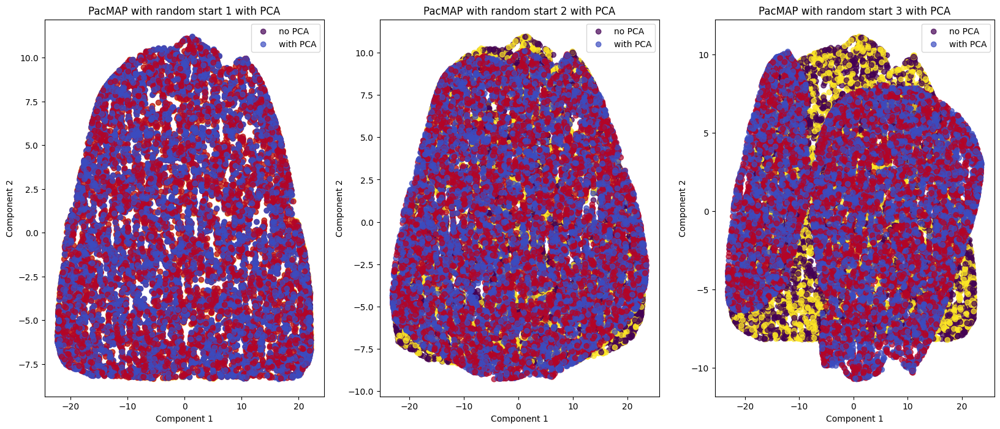

In [15]:
import umap.umap_ as umap
import pacmap
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
def visualize_projections_class(data, transformed_data, title, ax, cmap='viridis'):
    ax.scatter(transformed_data[:, 0], transformed_data[:, 1], alpha=0.7, c=data[:, 2], cmap=cmap, label='with PCA' if cmap!="viridis" else "no PCA") 
    ax.set_title(title)
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.legend()
    ax.grid()

def run_tsne_with_random_starts_class(data, n_starts=5):
    n_samples = data.shape[0]

    perplexity_value = min(30, n_samples - 1)
    fig, axs = plt.subplots(1, n_starts, figsize=(20, 8))
    for i in range(n_starts):
        tsne_model = TSNE(random_state=i, perplexity=perplexity_value)
        tsne_result = tsne_model.fit_transform(data)
        visualize_projections_class(data, tsne_result, f"t-SNE with random start {i+1}, perplexity {perplexity_value}, without PCA", axs[i])

        pca = PCA()
        transformed_data = pca.fit_transform(data)
        tsne_model = TSNE(random_state=i, perplexity=perplexity_value)
        tsne_result = tsne_model.fit_transform(transformed_data)
        visualize_projections_class(data, tsne_result, f"t-SNE with random start {i+1}, perplexity {perplexity_value}, with PCA", axs[i], cmap='coolwarm')

    plt.show()



def run_umap_with_random_starts_class(data, n_starts=5):
    fig, axs = plt.subplots(1, n_starts, figsize=(20, 8))
    for i in range(n_starts):
        umap_model = umap.UMAP(random_state=i)
        umap_result = umap_model.fit_transform(data)
        visualize_projections_class(data, umap_result, f"UMAP with random start {i+1} without PCA", axs[i])

        pca = PCA()
        transformed_data = pca.fit_transform(data)
        umap_model = umap.UMAP(random_state=i)
        umap_result = umap_model.fit_transform(transformed_data)
        visualize_projections_class(data, umap_result, f"UMAP with random start {i+1} with PCA", axs[i], cmap='coolwarm')
        print("Plot with PCA")

    plt.show()

def run_pacmap_with_random_starts_class(data, n_starts=5):
    fig, axs = plt.subplots(1, n_starts, figsize=(20, 8))
    for i in range(n_starts):
        pacmap_model = pacmap.PaCMAP(n_neighbors=None, random_state=i+40, FP_ratio=1.0, verbose=True)
        pacmap_result = pacmap_model.fit_transform(data, init='pca')
        visualize_projections_class(data, pacmap_result, f"PacMAP with random start {i+1} without PCA", axs[i])
        
        pca = PCA()
        transformed_data = pca.fit_transform(data)
        pacmap_model = pacmap.PaCMAP(n_neighbors=None, random_state=i+40, FP_ratio=1.0, verbose=True)
        pacmap_result = pacmap_model.fit_transform(transformed_data, init='pca')
        visualize_projections_class(data, pacmap_result, f"PacMAP with random start {i+1} with PCA", axs[i], cmap='coolwarm')
    plt.show()

# Порежем датасет и возьмём 1/10 часть
_, cut_dfv = train_test_split(df_256v, test_size=len(df_256v)//20)

print(cut_dfv.shape)

run_umap_with_random_starts_class(cut_dfv, n_starts=3)
run_tsne_with_random_starts_class(cut_dfv, n_starts=3)
run_pacmap_with_random_starts_class(cut_dfv, n_starts=3)

In [ ]:
from sklearn.datasets import load_wine
import pandas as pd


df = pd.read_csv("gym_members_exercise_tracking.csv")
to_factorize = ['Workout_Type']

for f in to_factorize:
    df[f"{f}_fact"], _ = pd.factorize(df[f])
    df = df.drop(columns=f)

target = pd.factorize(df['Gender'])

 
df = df.drop(columns='Gender')

df_tg = df.copy()
df_tg["targeted"] = target[0]
print(df_tg)
print(df_tg.describe())

     Age  Weight (kg)  Height (m)  Max_BPM  Avg_BPM  Resting_BPM  \
0     56         88.3        1.71      180      157           60   
1     46         74.9        1.53      179      151           66   
2     32         68.1        1.66      167      122           54   
3     25         53.2        1.70      190      164           56   
4     38         46.1        1.79      188      158           68   
..   ...          ...         ...      ...      ...          ...   
968   24         87.1        1.74      187      158           67   
969   25         66.6        1.61      184      166           56   
970   59         60.4        1.76      194      120           53   
971   32        126.4        1.83      198      146           62   
972   46         88.7        1.63      166      146           66   

     Session_Duration (hours)  Calories_Burned  Fat_Percentage  \
0                        1.69           1313.0            12.6   
1                        1.30            883.0     

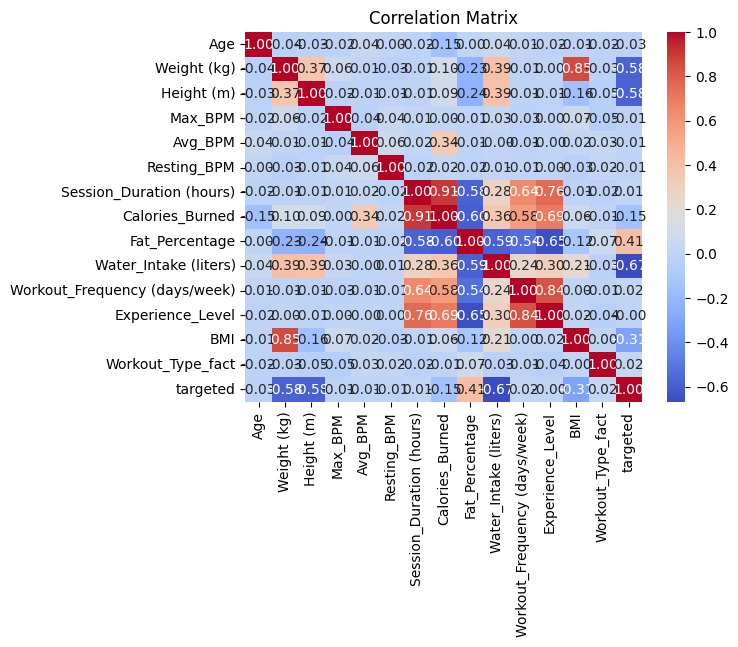

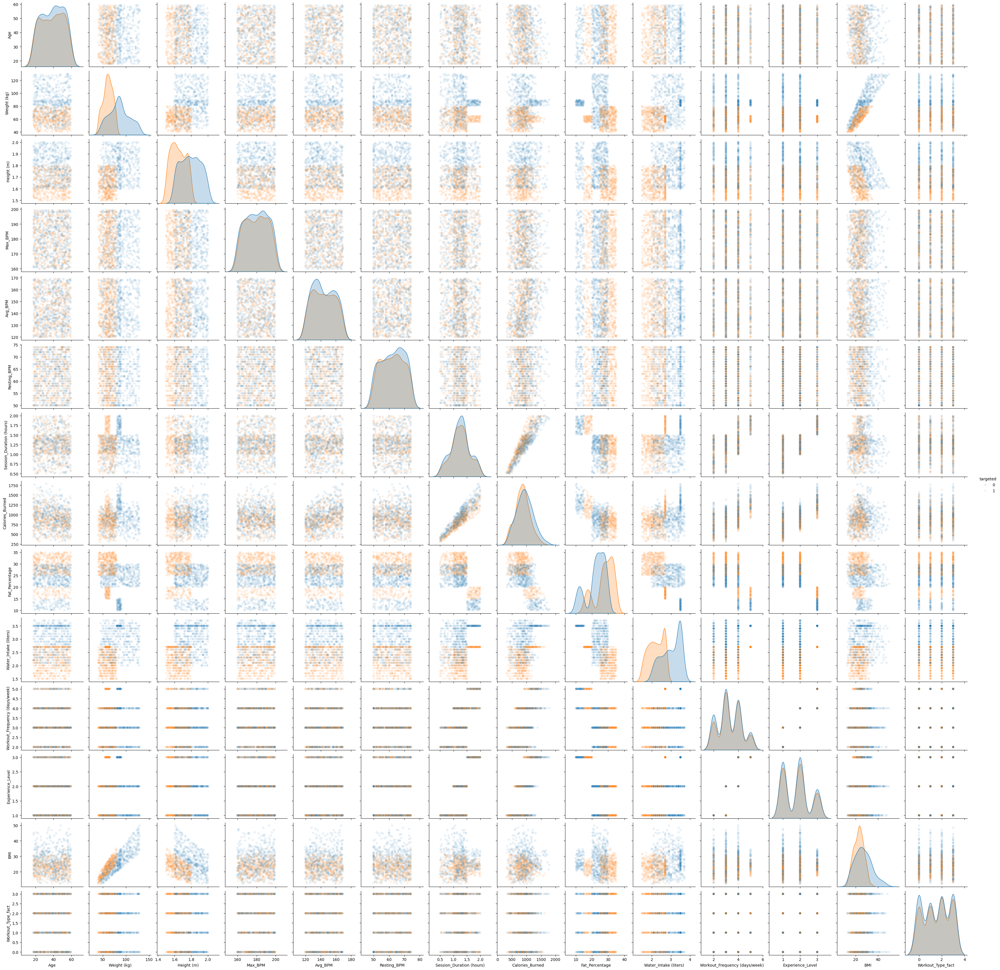

In [ ]:
import seaborn as sns

plt.title('Correlation Matrix')
sns.heatmap(df_tg.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

sns.pairplot(df_tg, hue='targeted', plot_kws={'alpha':0.1})
plt.show()

     Age  Weight (kg)  Height (m)  Max_BPM  Avg_BPM  Resting_BPM  \
0     56         88.3        1.71      180      157           60   
1     46         74.9        1.53      179      151           66   
2     32         68.1        1.66      167      122           54   
3     25         53.2        1.70      190      164           56   
4     38         46.1        1.79      188      158           68   
..   ...          ...         ...      ...      ...          ...   
968   24         87.1        1.74      187      158           67   
969   25         66.6        1.61      184      166           56   
970   59         60.4        1.76      194      120           53   
971   32        126.4        1.83      198      146           62   
972   46         88.7        1.63      166      146           66   

     Session_Duration (hours)  Calories_Burned  Fat_Percentage  \
0                        1.69           1313.0            12.6   
1                        1.30            883.0     

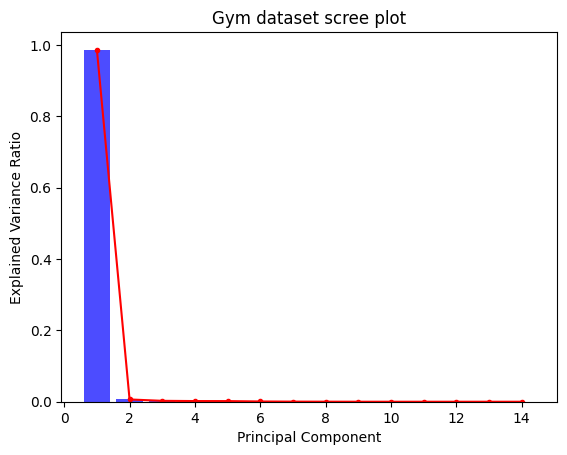

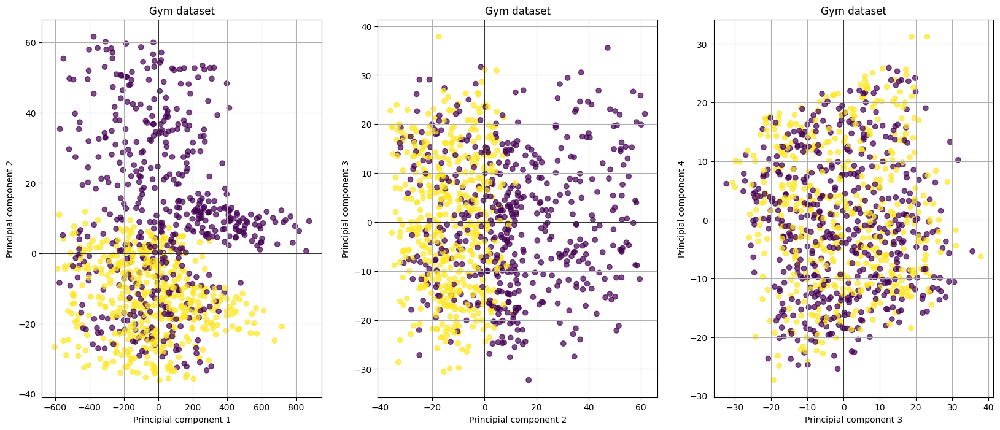

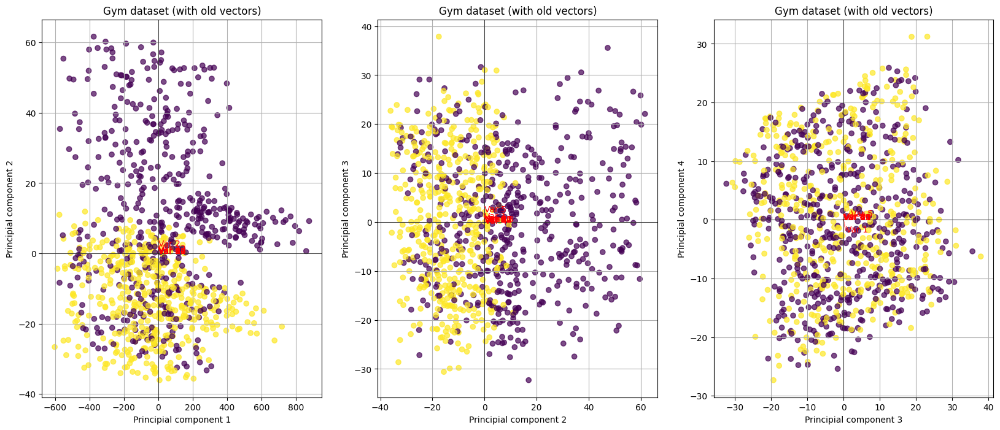

In [ ]:
def visualize_pca_df(data, a, target, title, c=0, show_vectors=False):

    pca = PCA(n_components=10)
    transformed_data = pca.fit_transform(data)
    fig, axs = plt.subplots(1, a-1, figsize=(20, 8))
    for ax, cs in zip(axs, range(c, c+a-1)):
        ax.scatter(transformed_data[:, cs], transformed_data[:, cs + 1], c=target[0], cmap='viridis', alpha=0.7)

        if show_vectors:
            for i, vector in enumerate(pca.components_.T):
                ax.arrow(0, 0, vector[cs] * 2, vector[cs + 1] * 2, color='r', alpha=0.5)
                ax.text(vector[cs] * 2.2, vector[cs + 1] * 2.2, f'Var {i+1}', color='r', fontsize=10)
        
        ax.set_title(title)
        ax.set_xlabel(f'Principial component {cs+1}')
        ax.set_ylabel(f'Principial component {cs+2}')
        ax.axhline(0, color='black', linewidth=0.5)
        ax.axvline(0, color='black', linewidth=0.5)
        ax.grid()
    plt.show()

plot_scree(df, 'Gym dataset scree plot')

visualize_pca_df(df, 4, target, 'Gym dataset')
visualize_pca_df(df, 4, target, title='Gym dataset (with old vectors)', show_vectors=True)



Kaiser: 9 components


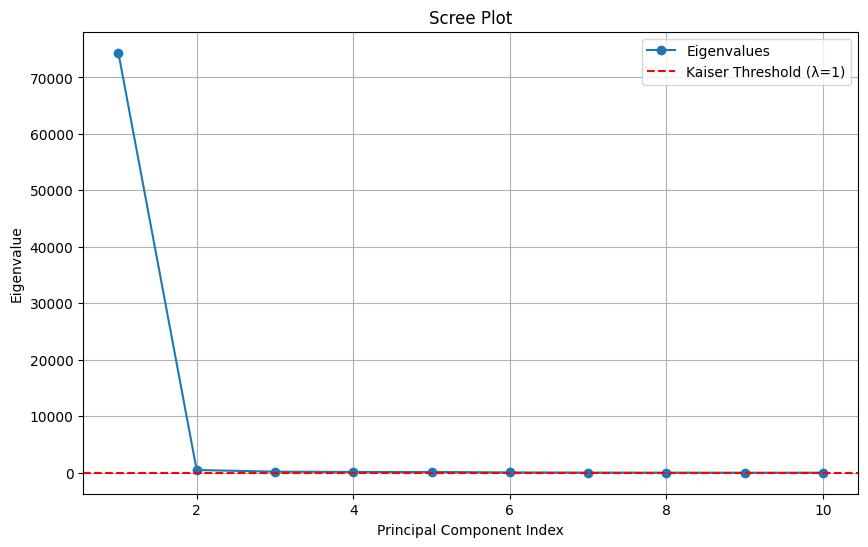

Knee: 2 components


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

pca = PCA(n_components=10)
transformed_data = pca.fit(df)
eigenvalues = pca.explained_variance_

kaiser_components = np.sum(eigenvalues > 1)
print(f"Kaiser: {kaiser_components} components")

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', label="Eigenvalues")
plt.axhline(y=1, color='r', linestyle='--', label="Kaiser Threshold (λ=1)")
plt.title("Scree Plot")
plt.xlabel("Principal Component Index")
plt.ylabel("Eigenvalue")
plt.grid(True)
plt.legend()
plt.show()

from kneed import KneeLocator

knee_locator = KneeLocator(range(1, len(eigenvalues) + 1), eigenvalues, curve="convex", direction="decreasing")
elbow_point = knee_locator.knee
print(f"Knee: {elbow_point} components")